<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#data-load-and-cleaning" data-toc-modified-id="data-load-and-cleaning-1">data load and cleaning</a></span><ul class="toc-item"><li><span><a href="#duet-datasets" data-toc-modified-id="duet-datasets-1.1"><em>duet</em> datasets</a></span></li><li><span><a href="#falling-and-provoking-datasets" data-toc-modified-id="falling-and-provoking-datasets-1.2"><em>falling and provoking</em> datasets</a></span></li><li><span><a href="#cleaning-&amp;-global-overview" data-toc-modified-id="cleaning-&amp;-global-overview-1.3">cleaning &amp; global overview</a></span></li><li><span><a href="#improve-annotations" data-toc-modified-id="improve-annotations-1.4">improve annotations</a></span></li></ul></li><li><span><a href="#explo.-stats" data-toc-modified-id="explo.-stats-2">explo. stats</a></span><ul class="toc-item"><li><span><a href="#static-TS" data-toc-modified-id="static-TS-2.1">static TS</a></span></li><li><span><a href="#inter.-plot" data-toc-modified-id="inter.-plot-2.2">inter. plot</a></span></li></ul></li><li><span><a href="#consensus-check" data-toc-modified-id="consensus-check-3">consensus check</a></span><ul class="toc-item"><li><span><a href="#load-half-sec-frames" data-toc-modified-id="load-half-sec-frames-3.1">load half sec frames</a></span></li><li><span><a href="#consensus-check" data-toc-modified-id="consensus-check-3.2">consensus check</a></span></li></ul></li></ul></div>

In [1]:
import pandas as pd
import numpy as np

# modules for plotting
import matplotlib.pyplot as plt
%matplotlib inline
# this module is needed for 3D plot
from mpl_toolkits.mplot3d import Axes3D

import seaborn as sns
sns.set_context('notebook')
%config InlineBackend.figure_format = 'retina'

# modules for stats
from scipy import stats
import powerlaw 
import itertools as itt

# module to save space
import gc

# parse dates
from datetime import  datetime

In [2]:
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

# data load and cleaning

In [3]:
ls ./manually_extr_datasets/

Falling_Provoking_05_sec_SWH6-26-18.txt*
Falling_and_Provoking-05s-PM.txt*
contact_Imrov_DUET_Dance_improvisation_project_SWH_25.txt*
contact_improv_duet_halfsec_SM.txt*
contact_improv_duets-PM_25.txt*
contact_improv_duets_dance_improvisation_05secs_VRV.txt*


here we load all df together -- since there as been *no improvements on how to solve mismatch*

## _duet_ datasets 
(one for each annotator)

In [4]:
# start first with SM version, as it's the only one with col names!
full_df = pd.read_csv('./manually_extr_datasets/contact_improv_duet_halfsec_SM.txt',
                     header=1,dtype=str)

# add col for video name
full_df['video'] = 'improv_duet_halfsec'

# add col for analyser person
full_df['annotator'] = 'SM'

print(full_df.shape)

## read and concatenate other dataset ####
part_df = pd.read_csv('./manually_extr_datasets/contact_improv_duets_dance_improvisation_05secs_VRV.txt',
            header=None,dtype=str,names=full_df.columns)

# add col for analyser person
part_df['annotator'] = 'VRV'

# add col for video name
part_df['video'] = 'improv_duet_halfsec'

print(part_df.shape)


## concat the two versions
full_df = pd.concat([full_df,part_df])

print(full_df.shape)
full_df.head()

(257, 5)
(256, 5)
(513, 5)


,frame,A,B,video,annotator
0,0,100,100,improv_duet_halfsec,SM
1,2,100,100,improv_duet_halfsec,SM
2,4,000,000,improv_duet_halfsec,SM
3,6,000,000,improv_duet_halfsec,SM
4,8,000,000,improv_duet_halfsec,SM


##  _falling and provoking_ datasets 
(one for each annotator)

In [5]:
# read 1st Falling_and_Provoking
part_df = pd.read_csv('./manually_extr_datasets/Falling_and_Provoking-05s-PM.txt',
            header=1,dtype=str)

# add col for analyser person
part_df['annotator'] = 'PM'

# add col for video name
part_df['video'] = 'Falling_and_Provoking'

# concat
full_df = pd.concat([full_df,part_df])

# read 2nd Falling_and_Provoking
part_df = pd.read_csv('./manually_extr_datasets/Falling_Provoking_05_sec_SWH6-26-18.txt',
                      dtype=str)

# add col for analyser person
part_df['annotator'] = 'SWH'

# add col for video name
part_df['video'] = 'Falling_and_Provoking'

# concat
full_df = pd.concat([full_df,part_df])

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel/__main__.py:12: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel/__main__.py:25: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




## cleaning & global overview

fix data type

In [6]:
full_df.frame = full_df.frame.astype(int)

overview

In [7]:
print(full_df.shape)
full_df.head()

(1111, 5)


,A,B,annotator,frame,video
0,100,100,SM,0,improv_duet_halfsec
1,100,100,SM,2,improv_duet_halfsec
2,000,000,SM,4,improv_duet_halfsec
3,000,000,SM,6,improv_duet_halfsec
4,000,000,SM,8,improv_duet_halfsec


N. frames per annotator

In [8]:
full_df.annotator.value_counts()

PM     337
SWH    261
SM     257
VRV    256
Name: annotator, dtype: int64

N. frames per video

In [9]:
full_df.video.value_counts()

Falling_and_Provoking    598
improv_duet_halfsec      513
Name: video, dtype: int64

## improve annotations

type of contact in frames

In [10]:
print(full_df.A.unique())

print(full_df.B.unique())

full_df.dtypes

['100' '000' '110' '111' '010' '001' '101' '011']
['100' '000' '110' '111' '101' '010' '011' '001']


A            object
B            object
annotator    object
frame         int64
video        object
dtype: object

here we convert 1s and 0s to --> 'TAL' = __torso/arms/legs__

In [11]:
def convert_fun(old_annotation):
    
    new_annotation = 'T' * (old_annotation[0]=='1') +\
                        'A' * (old_annotation[1]=='1') +\
                        'L' * (old_annotation[2]=='1') +\
                        'no contact' * (old_annotation == '000')
    return new_annotation

In [12]:
full_df.A = full_df.A.apply(convert_fun)
full_df.B = full_df.B.apply(convert_fun)

check back

In [13]:
print(full_df.A.unique())
print(full_df.B.unique())

full_df.dtypes

['T' 'no contact' 'TA' 'TAL' 'A' 'L' 'TL' 'AL']
['T' 'no contact' 'TA' 'TAL' 'TL' 'A' 'AL' 'L']


A            object
B            object
annotator    object
frame         int64
video        object
dtype: object

# explo. stats

## static TS

In [48]:
full_df.video.unique()

array(['improv_duet_halfsec', 'Falling_and_Provoking'], dtype=object)

to do: need to __share y axis__!

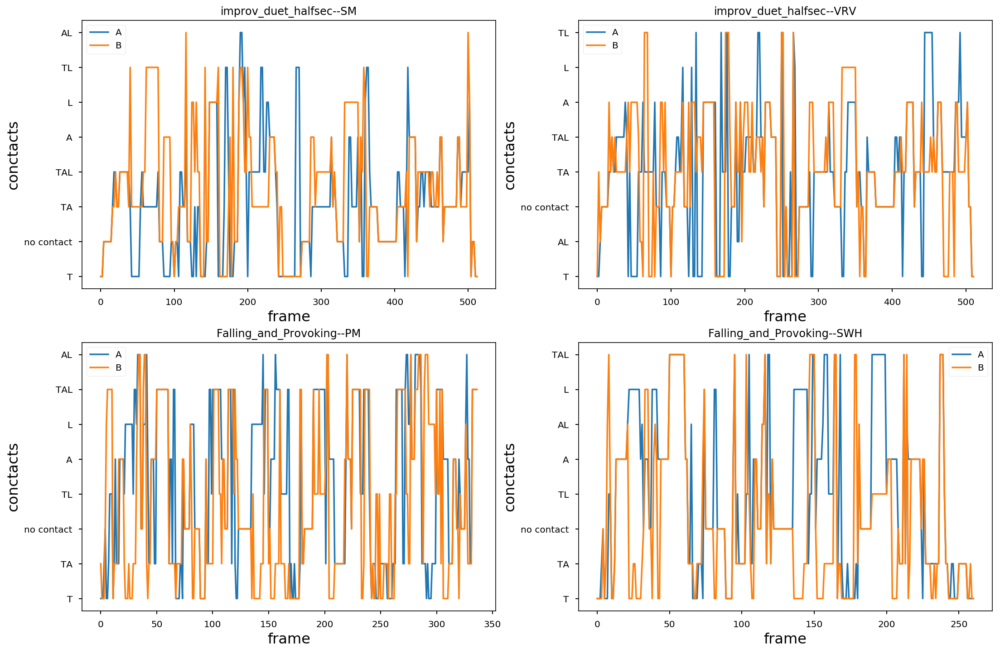

In [47]:
fig = plt.figure()
num = 0

fig.set_figheight(12)
fig.set_figwidth(18)

for my_video in full_df.video.unique():
    for my_ann in full_df[full_df.video==my_video].annotator.unique():
        
        # set up the subplot         
        num +=1        
        ax = fig.add_subplot(2,2,num)
        
        # plot the subset data         
        my_data = (full_df.video==my_video) & (full_df.annotator==my_ann)

        ax.plot(full_df[my_data].frame,full_df[my_data].A,label='A')
        ax.plot(full_df[my_data].frame,full_df[my_data].B,label='B')        
        ax.set_title(my_video + '--' +  my_ann)
        ax.legend()
#         ax.axis()
        
        
        ax.set_ylabel('conctacts',size=16)
        ax.set_xlabel('frame',size=16)
        
fig.savefig('ts_2videos_2annotators.pdf')        

## inter. plot

In [14]:
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

In [15]:
full_trace = []

for my_video in full_df.video.unique():
    for my_ann in full_df[full_df.video==my_video].annotator.unique():


        my_data = (full_df.video==my_video) & (full_df.annotator==my_ann) 
    
        full_trace.append(
            go.Scatter(
                x = full_df[my_data].frame,
                y = full_df[my_data].A,
                name = my_video + '-' + my_ann + '-' +  'A'
#                 mode='markers',
            #     text = my_text,
            #     hoverinfo = 'text'
            )
        )
        
        full_trace.append(
            go.Scatter(
                x = full_df[my_data].frame,
                y = full_df[my_data].B,
                name = my_video + '-' + my_ann + '-' +  'B'
#                 mode='markers',
            #     text = my_text,
            #     hoverinfo = 'text'
            )
        )        

In [17]:
# setting layout
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     ),
    legend=dict(
        x=0.9,
        y=1.4,
        font=dict(
            size=8
#             color=list(state_grouped.state.unique())
        )
    ),
    xaxis=dict(
        title='frame',
        titlefont=dict(
            size=18
        )
    ),
    yaxis=dict(
        title='contact points',
        titlefont=dict(
            size=18
        )
    )
)

In [18]:
fig = go.Figure(data=full_trace, layout=layout)
py.plot(fig,filename='./inter_annotations.html')

'file:///Users/lazzari/Documents/improv_dance/inter_annotations.html'

In [22]:
import plotly

In [25]:
# plotly.tools.set_credentials_file(username='ggrrll', api_key='put_your_key')

In [24]:
plotly.plotly.plot(fig,filename='impro_dance_annotations',sharing='public')

High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~ggrrll/0 or inside your plot.ly account where it is named 'impro_dance_annotations'


'https://plot.ly/~ggrrll/0'

# consensus check

In [33]:
# read 2st Falling_and_Provoking
part_df = pd.read_csv('./manually_extr_datasets/Falling_and_Provoking-05s-PM.txt',
            header=1)

part_df.head()

# add col for analyser person
part_df['person'] = 'PM'

# add col for video name
part_df['video'] = 'Falling_and_Provoking'


duet_df = pd.concat([duet_df,part_df])

,frame,A,B
0,0,100,110
1,1,100,100
2,2,100,100
3,3,110,100
4,4,0,0


## load half sec frames

In [86]:
# start first with SM version, as it's the only one with col names!
duet_df = pd.read_csv('./manually_extr_datasets/contact_improv_duet_halfsec_SM.txt')

# save col names
col_names = duet_df.columns

# add col for analyser person
duet_df['person'] = 'SM'

# print(duet_df.shape)
# duet_df.head()

# read and concatenate other dataset
part_df = pd.read_csv('./manually_extr_datasets/contact_improv_duets_dance_improvisation_05secs_VRV.txt',
            header=None,names=col_names)

# add col for analyser person
part_df['person'] = 'VRV'

duet_df = pd.concat([duet_df,part_df])

# remove temp dataset
del part_df
gc.collect()

print(duet_df.shape)
duet_df.head()

(513, 4)


,frame,woman_A,man_B,person
0,0,100,100,SM
1,2,100,100,SM
2,4,0,0,SM
3,6,0,0,SM
4,8,0,0,SM


first issue: __not the same number of frames__

In [38]:
duet_df.person.value_counts()

SM     257
VRV    256
Name: person, dtype: int64

this is the 'missing' frame from VRV dataset

In [42]:
duet_df.frame.value_counts().sort_values()[:3]

512    1
450    2
482    2
Name: frame, dtype: int64

In [84]:
duet_df.frame.nunique()

257

## consensus check

In [105]:
n_mismatch_man = 0
n_mismatch_woman = 0

for my_f in duet_df.frame.unique():
    
#     print(my_f)
#     print(sum(duet_df.frame==my_f))
    
    # check  if there are at least 2 copies of the same frame     
    if (sum(duet_df.frame==my_f) > 1):
        
        #this code be put in a loop...         
        frame_per1 = (duet_df.frame==my_f) & (duet_df.person=='SM')
        frame_per2 = (duet_df.frame==my_f) & (duet_df.person=='VRV')        
                
        if any(duet_df.man_B[frame_per1]!=duet_df.man_B[frame_per2]):
            
            n_mismatch_man += 1
            print(duet_df.loc[duet_df.frame==my_f,['frame', 'man_B', 'person']])

        if any(duet_df.woman_A[frame_per1]!=duet_df.woman_A[frame_per2]):
            
            n_mismatch_woman += 1
            print( duet_df.loc[duet_df.frame==my_f,['frame', 'woman_A', 'person']] )            
            
print('n_mismatch_man = ',n_mismatch_man)            
print('n_mismatch_woman = ',n_mismatch_woman)

   frame  man_B person
1      2    100     SM
1      2    110    VRV
   frame  man_B person
2      4      0     SM
2      4     11    VRV
   frame  woman_A person
2      4        0     SM
2      4       11    VRV
   frame  man_B person
8     16    110     SM
8     16     10    VRV
   frame  woman_A person
9     18      111     SM
9     18      110    VRV
    frame  man_B person
12     24    110     SM
12     24    111    VRV
    frame  man_B person
13     26    111     SM
13     26    110    VRV
    frame  man_B person
14     28    111     SM
14     28    110    VRV
    frame  man_B person
15     30    111     SM
15     30    110    VRV
    frame  man_B person
16     32    111     SM
16     32    110    VRV
    frame  man_B person
17     34    111     SM
17     34    110    VRV
    frame  man_B person
18     36    111     SM
18     36    110    VRV
    frame  woman_A person
19     38      111     SM
19     38       10    VRV
    frame  man_B person
20     40    101     SM
20     40    

     frame  woman_A person
143    286      100     SM
143    286        0    VRV
     frame  woman_A person
145    290      110     SM
145    290      100    VRV
     frame  man_B person
146    292    110     SM
146    292     10    VRV
     frame  woman_A person
146    292      110     SM
146    292      100    VRV
     frame  man_B person
147    294    111     SM
147    294    110    VRV
     frame  man_B person
148    296    111     SM
148    296    110    VRV
     frame  man_B person
149    298    111     SM
149    298    110    VRV
     frame  man_B person
150    300    111     SM
150    300    110    VRV
     frame  man_B person
151    302    111     SM
151    302    110    VRV
     frame  man_B person
152    304    111     SM
152    304    110    VRV
     frame  man_B person
153    306    111     SM
153    306    110    VRV
     frame  man_B person
154    308    111     SM
154    308    110    VRV
     frame  man_B person
156    312    111     SM
156    312    110    VRV
     fr